In [ ]:
# To help with reading and manipulating data
import pandas as pd
pd.set_option('display.html.use_mathjax', False)
import numpy as np

# To help with data visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# To be used for missing value imputation
from sklearn.impute import SimpleImputer

# To help with model building
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    ConfusionMatrixDisplay,
)

# To be used for data scaling and one hot encoding
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

# To be used for tuning the model
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# To define maximum number of columns to be displayed in a dataframe
pd.set_option("display.max_columns", None)

# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings

warnings.filterwarnings("ignore")


# This will help in making the Python code more structured automatically (good coding practice)
# %load_ext nb_black

#Imblearn Installation

In [ ]:
#Imblearn library is used to handle imbalanced data
!pip install imblearn --user
!pip install imbalanced-learn --user

#Load the Data

In [ ]:
#Read Data into System
bank = pd.read_csv('BankChurners.csv')

In [ ]:
#Get rows and columns of the data
bank.shape

(10127, 21)

#Data Overview

In [ ]:
data = bank.copy()

In [ ]:
#View first 5 records of data
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [ ]:
#View last 5 records of data
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,NaN,Divorced,$40K - $60K,Blue,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,NaN,$40K - $60K,Blue,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.000,1961,8427.000,0.703,10294,61,0.649,0.189


In [ ]:
#Check data types by column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
#Check for data duplication
data.duplicated().sum()

0

In [ ]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.000
Attrition_Flag              0.000
Customer_Age                0.000
Gender                      0.000
Dependent_count             0.000
Education_Level            15.000
Marital_Status              7.400
Income_Category             0.000
Card_Category               0.000
Months_on_book              0.000
Total_Relationship_Count    0.000
Months_Inactive_12_mon      0.000
Contacts_Count_12_mon       0.000
Credit_Limit                0.000
Total_Revolving_Bal         0.000
Avg_Open_To_Buy             0.000
Total_Amt_Chng_Q4_Q1        0.000
Total_Trans_Amt             0.000
Total_Trans_Ct              0.000
Total_Ct_Chng_Q4_Q1         0.000
Avg_Utilization_Ratio       0.000
dtype: float64



*   We observe 15% of Education_Level values are missing.
*   We observe 7.4% of Marital_Status values are missing.
*   These values will be imputed after splitting the data into train, validation and test sets.





In [ ]:
#Check for null values in the dataset
data.isna().sum()

CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64

#####**Check the number of unique values in each column**

In [ ]:
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 6
Marital_Status                  3
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64



1.   From here, we can see characteristics where customers are relatively more homogenous (Months_on_Book, Months_Inactive_12_mon, etc.) and where customers are relatively more hetergenous (Avg_Open_To_Buy, Credit_Limit, etc.)




In [ ]:
# let's view the statistical summary of the numerical columns in the data
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


###**Checking the value count for each categorical variable**

In [ ]:
#User defined function for obtaining the distribution of the categorical variables
def categorical_analysis(data):
  for col in data:
    print(data[col].value_counts(normalize = True))
    print("-"*25)


In [ ]:
categorical_col = []
for i in range(data.shape[1]):
    if data.dtypes[i] == 'object':
        categorical_col.append(data.dtypes.index[i])
print(f'The categorical features of the data are: {categorical_col}')

The categorical features of the data are: ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


In [ ]:
categorical_analysis(data[categorical_col])

Attrition_Flag
Existing Customer   0.839
Attrited Customer   0.161
Name: proportion, dtype: float64
-------------------------
Gender
F   0.529
M   0.471
Name: proportion, dtype: float64
-------------------------
Education_Level
Graduate        0.363
High School     0.234
Uneducated      0.173
College         0.118
Post-Graduate   0.060
Doctorate       0.052
Name: proportion, dtype: float64
-------------------------
Marital_Status
Married    0.500
Single     0.420
Divorced   0.080
Name: proportion, dtype: float64
-------------------------
Income_Category
Less than $40K   0.352
$40K - $60K      0.177
$80K - $120K     0.152
$60K - $80K      0.138
abc              0.110
$120K +          0.072
Name: proportion, dtype: float64
-------------------------
Card_Category
Blue       0.932
Silver     0.055
Gold       0.011
Platinum   0.002
Name: proportion, dtype: float64
-------------------------




*Interestingly, 36.3% of customers, a majority, have a graduate level Education Level while also 35.2% of customers, a majority, earn less than \$40K -- a result that should be investigated to understand a somewhat contradictory finding.

*Lesser income in spite of high proportion of graduate degrees can possibly be explained by a majority female customer population.

*Overwhelming majority of customers have what is assumed to be a lower ranked card with possible a lower credit limit, the so-called "Blue" card category -- this would make sense with a majority Graduate customer population as these customers likely carry debt along with making less than $40K although, interestingly, the majority of customers are married and so it assumed that income is not joint, but individual.






##EDA

In [ ]:
#User defined function for batch univariate data analysis of quantitative features in a dataset
def univariate_analysis(data, feature, include_def = False):
  """
  This function computes major and minor outliers
  as defined in 'Introduction to Contemporary Statistical Methods --  second edition' by Dr. Lambert H. Koopmans (pg. 53).
  Minor outliers are defined by those values which are beyond Q3/Q1 +/- 1.5*IQR but less than Q3/Q1 +/- 3*IQR
  Major/Extreme outliers are defined by those values which are beyond Q3/Q1 +/- 3*IQR
  Also, this function computes other relevant statistics and plots germane to a univariate analysis of a random variable.

  Please note the following definitions/descriptions of skewness and kurtosis from the Engineering Statistics Handbook (https://www.itl.nist.gov/div898/handbook/eda/section3/eda35b.htm):
  *Skewness is a measure of symmetry, or more precisely, the lack of symmetry. A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.
  **Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution. That is, data sets with high kurtosis tend to have heavy tails, or outliers.
  **Data sets with low kurtosis tend to have light tails, or lack of outliers. A uniform distribution would be the extreme case.
  """
  ##Display Plots
  fig, axes = plt.subplots(ncols = 3, figsize = (15,5))
  sns.boxplot(data = data, x = feature, ax = axes[0]).set(title = f'Boxplot of {feature}')
  sns.histplot(data = data, x = feature, ax = axes[1]).set(title = f'Histogram plot of {feature}')
  sns.kdeplot(data = data, x = feature, ax = axes[2]).set(title = f'Density plot of {feature}')
  plt.show()

  Q1 = data[feature].quantile(.25) ; Q3 = data[feature].quantile(.75) ; Q2 = data[feature].quantile(.5) ; Mean = data[feature].mean()
  STD = np.std(data[feature]); SNR = Mean/STD ; CV = STD/Mean ; Skew = skew(data[feature], nan_policy = 'omit') ; Kurtosis = kurtosis(data[feature], nan_policy = 'omit')
  IQR = Q3 - Q1
  upper_fence = Q3 + 1.5*IQR ; lower_fence = Q1 - 1.5*IQR
  outer_upper_fence = Q3 + 3*IQR ; outer_lower_fence = Q1 - 3*IQR
  minor_outliers_Q3 = []
  major_outliers_Q3 = []
  minor_outliers_Q1 = []
  major_outliers_Q1 = []
  for i in range(data[(data[feature]>upper_fence) & (data[feature]<=outer_upper_fence)].shape[0]):
    minor_outliers_Q3.append(data[(data[feature]>upper_fence) & (data[feature]<=outer_upper_fence)].loc[:,feature].values[i])
  if len(minor_outliers_Q3) == 0:
    print('*There are no minor outliers beyond Quartile-3 + 1.5*IQR!')
  else:
    print('*The number of minor outliers beyond Quartile-3 + 1.5*IQR are:', len(minor_outliers_Q3), 'and the average of these outliers are:', round(pd.Series(minor_outliers_Q3).mean(), ndigits=2))
  for i in range(data[data[feature]> outer_upper_fence].shape[0]):
    major_outliers_Q3.append(data[data[feature]> outer_upper_fence].loc[:,feature].values[i])
  if len(major_outliers_Q3) == 0:
    print('*There are no major outliers beyond Quartile-3 + 3*IQR!')
  else:
    print('*The number major outliers beyond Quartile-3 + 3*IQR are:', len(major_outliers_Q3), 'and the average of these outliers are:', round(pd.Series(major_outliers_Q3).mean(), ndigits=2))
  for i in range(data[(data[feature]>= outer_lower_fence) & (data[feature]<lower_fence)].shape[0]):
    minor_outliers_Q1.append(data[(data[feature]>= outer_lower_fence) & (data[feature]<lower_fence)].loc[:,feature].values[i])
  if len(minor_outliers_Q1) == 0:
    print('*There are no minor outliers below Quartile-1 - 1.5*IQR!')
  else:
    print('*The number of minor outliers below Quartile-1 - 1.5*IQR are:', len(minor_outliers_Q1), 'and the average of these outliers are:', round(pd.Series(minor_outliers_Q1).mean(), ndigits=2))
  for i in range(data[(data[feature]<outer_lower_fence)].shape[0]):
    major_outliers_Q1.append(data[(data[feature]<outer_lower_fence)].loc[:,feature].values[i])
  if len(major_outliers_Q1) == 0:
    print('*There are no major outliers below Quartile-1 - 3*IQR!')
  else:
    print('*The number major outliers below Quartile-1 - 3*IQR are:', len(major_outliers_Q1), 'and the average of these outliers are:', round(pd.Series(major_outliers_Q1).mean(), ndigits=2))
  print('-'*50)
  print('-'*50)
  print('*Quartile-1 is:', round(Q1, ndigits=2))
  print('*Quartile-2 (median) is:', round(Q2, ndigits = 2))
  print('*Quartile-3 is:', round(Q3, ndigits = 2))
  print('*Quartile-1 - 1.5*IQR = ', round(lower_fence, ndigits = 2))
  print('*Quartile-1 - 3*IQR = ', round(outer_lower_fence, ndigits=2))
  print('*Quartile-3 + 1.5*IQR = ', round(upper_fence, ndigits=2))
  print('*Quartile-3 + 3*IQR = ', round(outer_upper_fence, ndigits=2))
  print('-'*50)
  print('-'*50)
  print(f'*Average of {feature} is:', round(Mean, ndigits=2))
  print(f'*Standard deviation of {feature} is:', round(STD, ndigits=2))
  print(f'*Skewness of {feature} is:', round(Skew, ndigits=2))
  print(f'*Kurtosis of {feature} is:', round(Kurtosis, ndigits = 2))
  print(f'*Coefficient of variation of {feature} is:', round(CV, ndigits = 2))
  if data[feature].min()>=0:
    print(f'*Signal to Noise Ratio of {feature} is:', round(SNR, ndigits=2))
    print('**Note: Signal to Noise Ratio statistic is only applicable to variables which are always non-negative**')
  else:
    print('*Signal to Noise Ratio DOES NOT EXIST')
  print('-'*50)
  print('-'*50)

  if include_def == True:
    print('**Definitions:')
    print(f'*Skewness is a measure of symmetry, or more precisely, the lack of symmetry. \n A distribution, or data set, is symmetric if it looks the same to the left and right of the center point.')

    print(f'*Kurtosis is a measure of whether the data are heavy-tailed or light-tailed relative to a normal distribution. \n That is, data sets with high kurtosis tend to have heavy tails, or outliers. \n Data sets with low kurtosis tend to have light tails, or lack of outliers. A uniform distribution would be the extreme case.')







In [ ]:
numeric_col = []
for i in range(data.shape[1]):
    if data.dtypes[i] == 'int64' or data.dtypes[i] == 'float64':
        numeric_col.append(data.dtypes.index[i])
print(f'The numeric features of the data are: {numeric_col}')


The numeric features of the data are: ['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


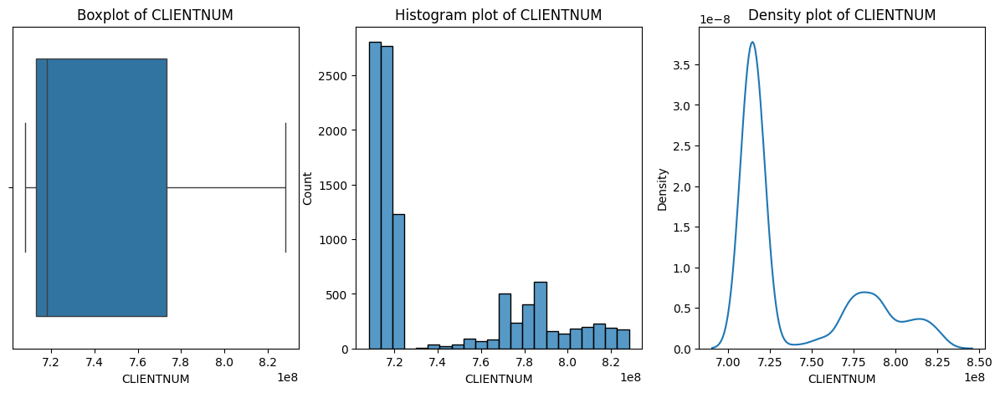

*There are no minor outliers beyond Quartile-3 + 1.5*IQR!
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 713036770.5
*Quartile-2 (median) is: 717926358.0
*Quartile-3 is: 773143533.0
*Quartile-1 - 1.5*IQR =  622876626.75
*Quartile-1 - 3*IQR =  532716483.0
*Quartile-3 + 1.5*IQR =  863303676.75
*Quartile-3 + 3*IQR =  953463820.5
--------------------------------------------------
--------------------------------------------------
*Average of CLIENTNUM is: 739177606.33
*Standard deviation of CLIENTNUM is: 36901961.36
*Skewness of CLIENTNUM is: 1.0
*Kurtosis of CLIENTNUM is: -0.62
*Coefficient of variation of CLIENTNUM is: 0.05
*Signal to Noise Ratio of CLIENTNUM is: 20.03
**Note: Signal to Noise Ratio statistic is only applicable to variables which are alw

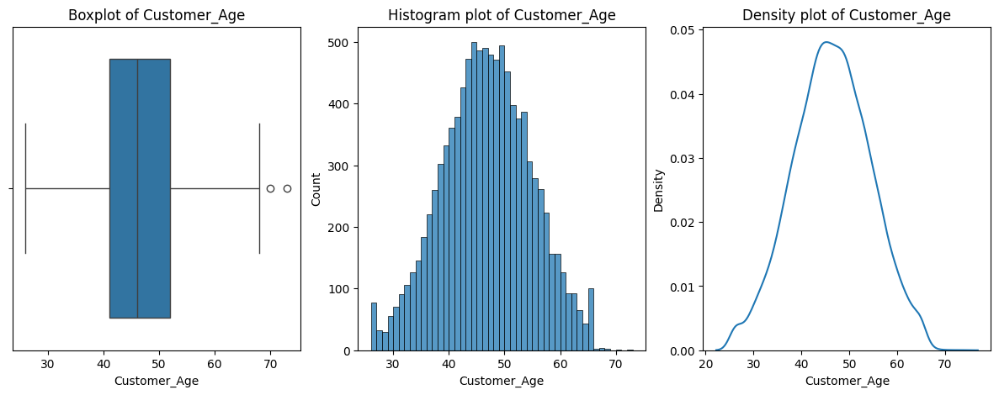

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 2 and the average of these outliers are: 71.5
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 41.0
*Quartile-2 (median) is: 46.0
*Quartile-3 is: 52.0
*Quartile-1 - 1.5*IQR =  24.5
*Quartile-1 - 3*IQR =  8.0
*Quartile-3 + 1.5*IQR =  68.5
*Quartile-3 + 3*IQR =  85.0
--------------------------------------------------
--------------------------------------------------
*Average of Customer_Age is: 46.33
*Standard deviation of Customer_Age is: 8.02
*Skewness of Customer_Age is: -0.03
*Kurtosis of Customer_Age is: -0.29
*Coefficient of variation of Customer_Age is: 0.17
*Signal to Noise Ratio of Customer_Age is: 5.78
**Note: Signal to Noise Ratio statistic is only applicable to variables which are

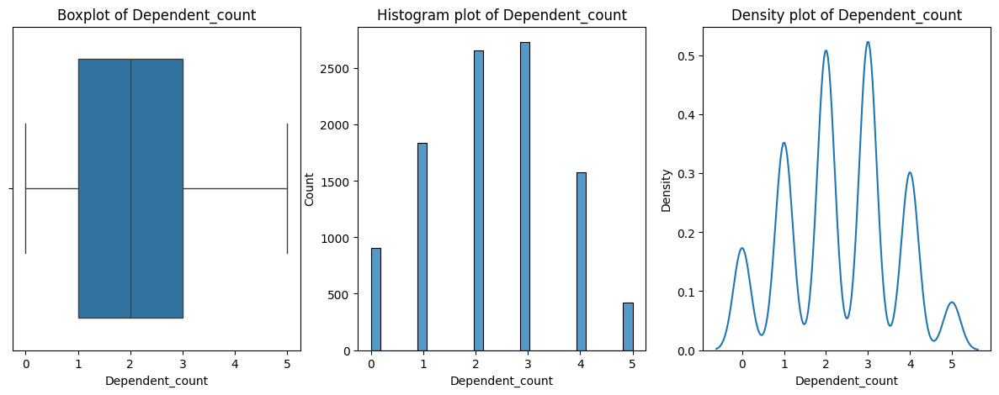

*There are no minor outliers beyond Quartile-3 + 1.5*IQR!
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 1.0
*Quartile-2 (median) is: 2.0
*Quartile-3 is: 3.0
*Quartile-1 - 1.5*IQR =  -2.0
*Quartile-1 - 3*IQR =  -5.0
*Quartile-3 + 1.5*IQR =  6.0
*Quartile-3 + 3*IQR =  9.0
--------------------------------------------------
--------------------------------------------------
*Average of Dependent_count is: 2.35
*Standard deviation of Dependent_count is: 1.3
*Skewness of Dependent_count is: -0.02
*Kurtosis of Dependent_count is: -0.68
*Coefficient of variation of Dependent_count is: 0.55
*Signal to Noise Ratio of Dependent_count is: 1.81
**Note: Signal to Noise Ratio statistic is only applicable to variables which are always non-negative**
----------------

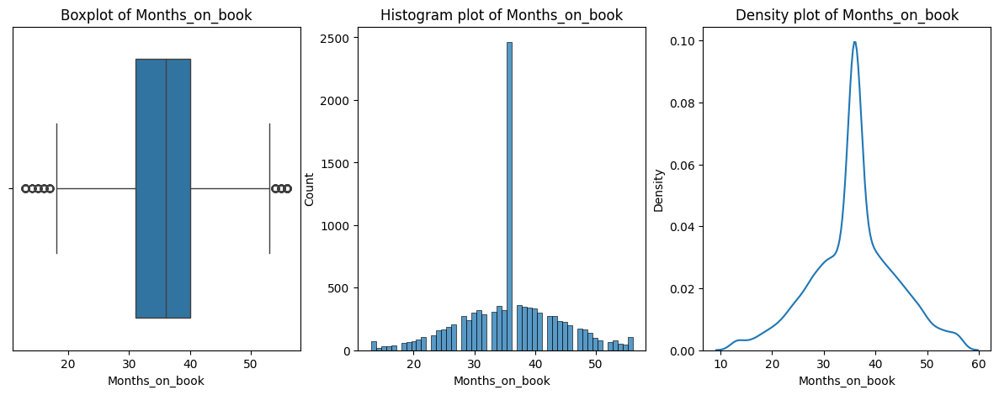

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 198 and the average of these outliers are: 55.25
*There are no major outliers beyond Quartile-3 + 3*IQR!
*The number of minor outliers below Quartile-1 - 1.5*IQR are: 188 and the average of these outliers are: 14.74
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 31.0
*Quartile-2 (median) is: 36.0
*Quartile-3 is: 40.0
*Quartile-1 - 1.5*IQR =  17.5
*Quartile-1 - 3*IQR =  4.0
*Quartile-3 + 1.5*IQR =  53.5
*Quartile-3 + 3*IQR =  67.0
--------------------------------------------------
--------------------------------------------------
*Average of Months_on_book is: 35.93
*Standard deviation of Months_on_book is: 7.99
*Skewness of Months_on_book is: -0.11
*Kurtosis of Months_on_book is: 0.4
*Coefficient of variation of Months_on_book is: 0.22
*Signal to Noise Ratio of Months_on_book is: 4.5
**Note: Signal 

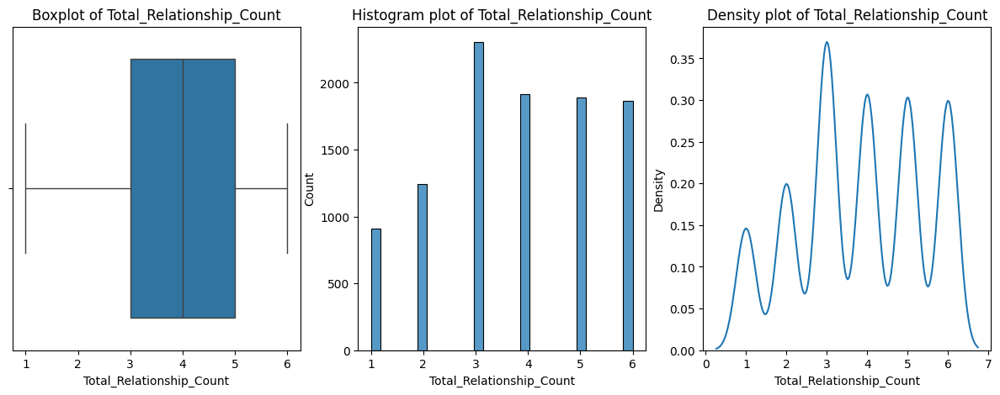

*There are no minor outliers beyond Quartile-3 + 1.5*IQR!
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 3.0
*Quartile-2 (median) is: 4.0
*Quartile-3 is: 5.0
*Quartile-1 - 1.5*IQR =  0.0
*Quartile-1 - 3*IQR =  -3.0
*Quartile-3 + 1.5*IQR =  8.0
*Quartile-3 + 3*IQR =  11.0
--------------------------------------------------
--------------------------------------------------
*Average of Total_Relationship_Count is: 3.81
*Standard deviation of Total_Relationship_Count is: 1.55
*Skewness of Total_Relationship_Count is: -0.16
*Kurtosis of Total_Relationship_Count is: -1.01
*Coefficient of variation of Total_Relationship_Count is: 0.41
*Signal to Noise Ratio of Total_Relationship_Count is: 2.45
**Note: Signal to Noise Ratio statistic is only applicable to var

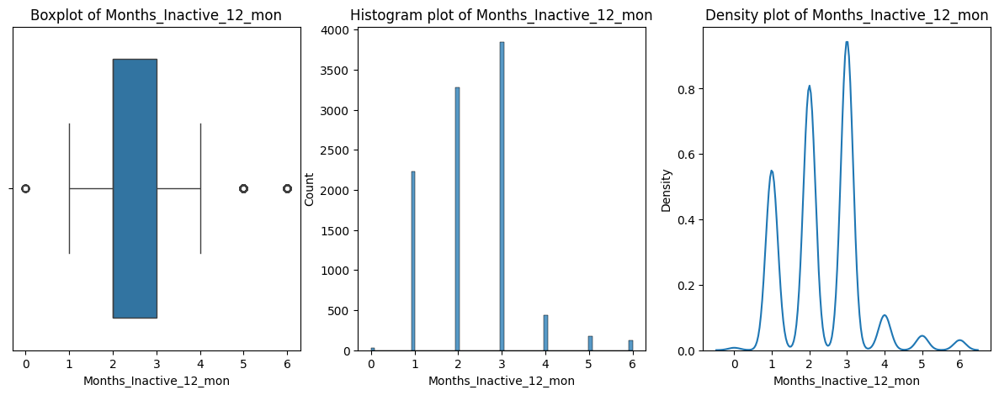

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 302 and the average of these outliers are: 5.41
*There are no major outliers beyond Quartile-3 + 3*IQR!
*The number of minor outliers below Quartile-1 - 1.5*IQR are: 29 and the average of these outliers are: 0.0
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 2.0
*Quartile-2 (median) is: 2.0
*Quartile-3 is: 3.0
*Quartile-1 - 1.5*IQR =  0.5
*Quartile-1 - 3*IQR =  -1.0
*Quartile-3 + 1.5*IQR =  4.5
*Quartile-3 + 3*IQR =  6.0
--------------------------------------------------
--------------------------------------------------
*Average of Months_Inactive_12_mon is: 2.34
*Standard deviation of Months_Inactive_12_mon is: 1.01
*Skewness of Months_Inactive_12_mon is: 0.63
*Kurtosis of Months_Inactive_12_mon is: 1.1
*Coefficient of variation of Months_Inactive_12_mon is: 0.43
*Signal to Noise Ratio of Months_In

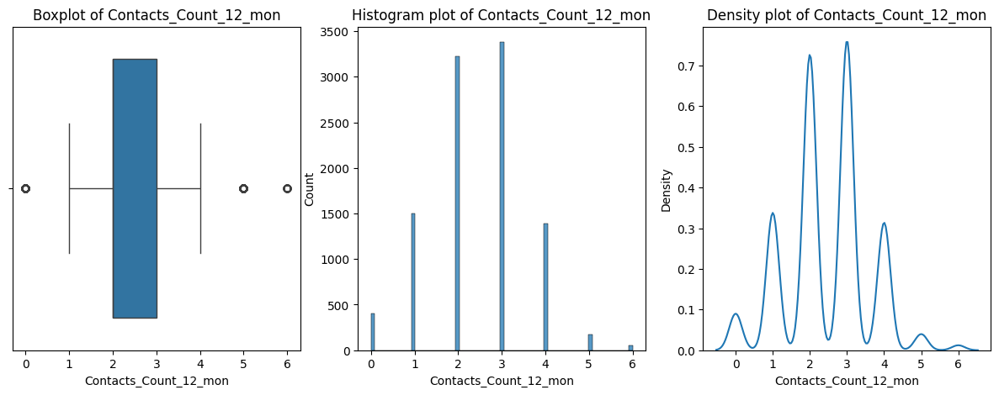

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 230 and the average of these outliers are: 5.23
*There are no major outliers beyond Quartile-3 + 3*IQR!
*The number of minor outliers below Quartile-1 - 1.5*IQR are: 399 and the average of these outliers are: 0.0
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 2.0
*Quartile-2 (median) is: 2.0
*Quartile-3 is: 3.0
*Quartile-1 - 1.5*IQR =  0.5
*Quartile-1 - 3*IQR =  -1.0
*Quartile-3 + 1.5*IQR =  4.5
*Quartile-3 + 3*IQR =  6.0
--------------------------------------------------
--------------------------------------------------
*Average of Contacts_Count_12_mon is: 2.46
*Standard deviation of Contacts_Count_12_mon is: 1.11
*Skewness of Contacts_Count_12_mon is: 0.01
*Kurtosis of Contacts_Count_12_mon is: 0.0
*Coefficient of variation of Contacts_Count_12_mon is: 0.45
*Signal to Noise Ratio of Contacts_Coun

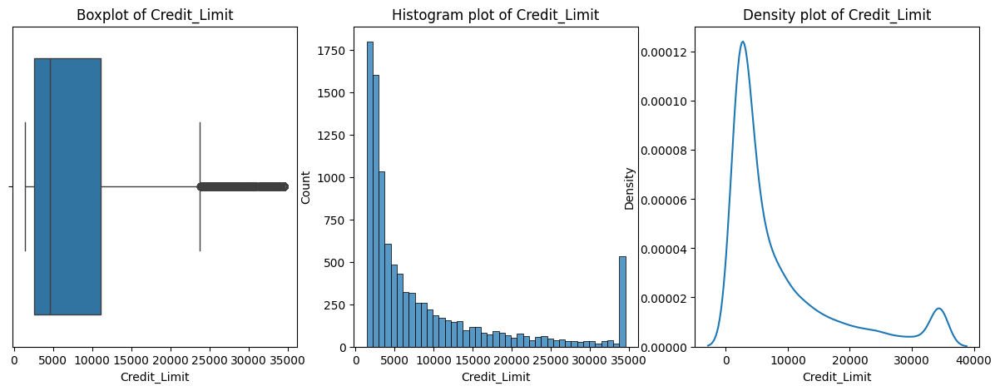

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 984 and the average of these outliers are: 31551.34
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 2555.0
*Quartile-2 (median) is: 4549.0
*Quartile-3 is: 11067.5
*Quartile-1 - 1.5*IQR =  -10213.75
*Quartile-1 - 3*IQR =  -22982.5
*Quartile-3 + 1.5*IQR =  23836.25
*Quartile-3 + 3*IQR =  36605.0
--------------------------------------------------
--------------------------------------------------
*Average of Credit_Limit is: 8631.95
*Standard deviation of Credit_Limit is: 9088.33
*Skewness of Credit_Limit is: 1.67
*Kurtosis of Credit_Limit is: 1.81
*Coefficient of variation of Credit_Limit is: 1.05
*Signal to Noise Ratio of Credit_Limit is: 0.95
**Note: Signal to Noise Ratio statistic is only 

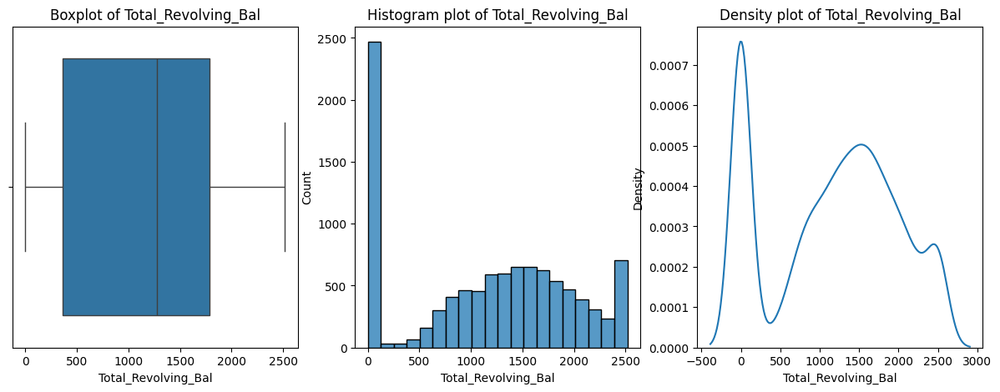

*There are no minor outliers beyond Quartile-3 + 1.5*IQR!
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 359.0
*Quartile-2 (median) is: 1276.0
*Quartile-3 is: 1784.0
*Quartile-1 - 1.5*IQR =  -1778.5
*Quartile-1 - 3*IQR =  -3916.0
*Quartile-3 + 1.5*IQR =  3921.5
*Quartile-3 + 3*IQR =  6059.0
--------------------------------------------------
--------------------------------------------------
*Average of Total_Revolving_Bal is: 1162.81
*Standard deviation of Total_Revolving_Bal is: 814.95
*Skewness of Total_Revolving_Bal is: -0.15
*Kurtosis of Total_Revolving_Bal is: -1.15
*Coefficient of variation of Total_Revolving_Bal is: 0.7
*Signal to Noise Ratio of Total_Revolving_Bal is: 1.43
**Note: Signal to Noise Ratio statistic is only applicable to variables

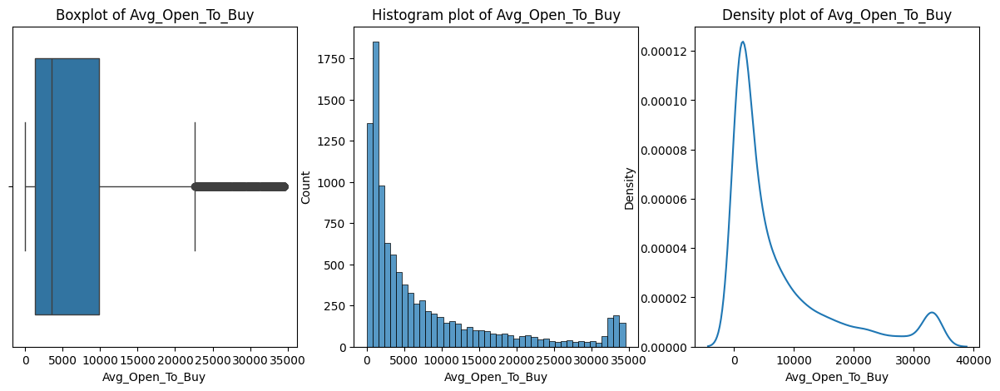

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 963 and the average of these outliers are: 30531.66
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 1324.5
*Quartile-2 (median) is: 3474.0
*Quartile-3 is: 9859.0
*Quartile-1 - 1.5*IQR =  -11477.25
*Quartile-1 - 3*IQR =  -24279.0
*Quartile-3 + 1.5*IQR =  22660.75
*Quartile-3 + 3*IQR =  35462.5
--------------------------------------------------
--------------------------------------------------
*Average of Avg_Open_To_Buy is: 7469.14
*Standard deviation of Avg_Open_To_Buy is: 9090.24
*Skewness of Avg_Open_To_Buy is: 1.66
*Kurtosis of Avg_Open_To_Buy is: 1.8
*Coefficient of variation of Avg_Open_To_Buy is: 1.22
*Signal to Noise Ratio of Avg_Open_To_Buy is: 0.82
**Note: Signal to Noise Ratio st

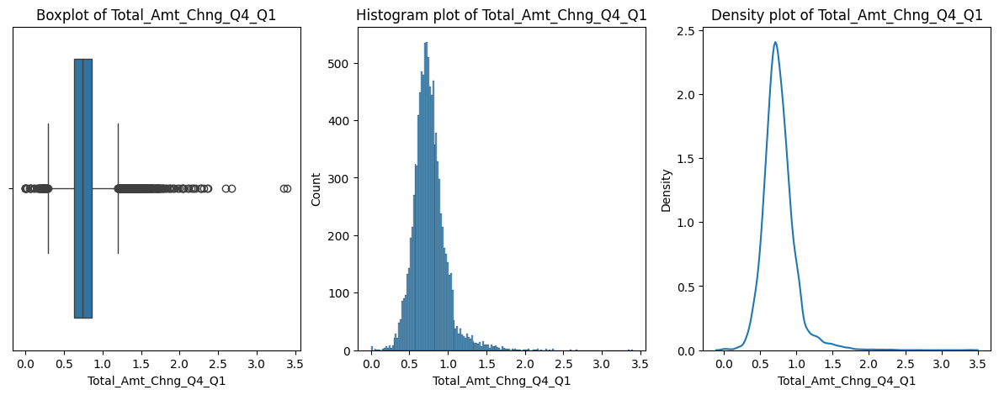

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 258 and the average of these outliers are: 1.34
*The number major outliers beyond Quartile-3 + 3*IQR are: 90 and the average of these outliers are: 1.83
*The number of minor outliers below Quartile-1 - 1.5*IQR are: 48 and the average of these outliers are: 0.18
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 0.63
*Quartile-2 (median) is: 0.74
*Quartile-3 is: 0.86
*Quartile-1 - 1.5*IQR =  0.29
*Quartile-1 - 3*IQR =  -0.05
*Quartile-3 + 1.5*IQR =  1.2
*Quartile-3 + 3*IQR =  1.54
--------------------------------------------------
--------------------------------------------------
*Average of Total_Amt_Chng_Q4_Q1 is: 0.76
*Standard deviation of Total_Amt_Chng_Q4_Q1 is: 0.22
*Skewness of Total_Amt_Chng_Q4_Q1 is: 1.73
*Kurtosis of Total_Amt_Chng_Q4_Q1 is: 9.99
*Coefficient of variation of Total_Amt_Chng_Q4_

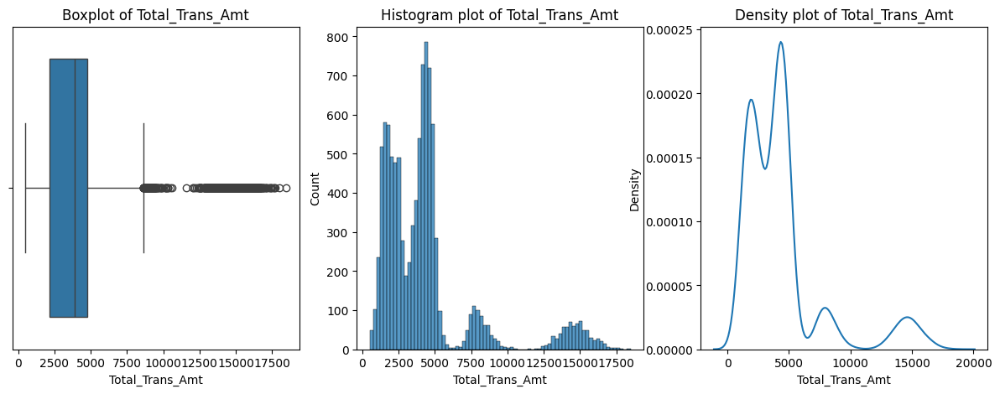

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 159 and the average of these outliers are: 9313.23
*The number major outliers beyond Quartile-3 + 3*IQR are: 737 and the average of these outliers are: 14731.74
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 2155.5
*Quartile-2 (median) is: 3899.0
*Quartile-3 is: 4741.0
*Quartile-1 - 1.5*IQR =  -1722.75
*Quartile-1 - 3*IQR =  -5601.0
*Quartile-3 + 1.5*IQR =  8619.25
*Quartile-3 + 3*IQR =  12497.5
--------------------------------------------------
--------------------------------------------------
*Average of Total_Trans_Amt is: 4404.09
*Standard deviation of Total_Trans_Amt is: 3396.96
*Skewness of Total_Trans_Amt is: 2.04
*Kurtosis of Total_Trans_Amt is: 3.89
*Coefficient of variation of Total_Trans_Amt is: 0.77
*Signal to Noise Ratio of Total_

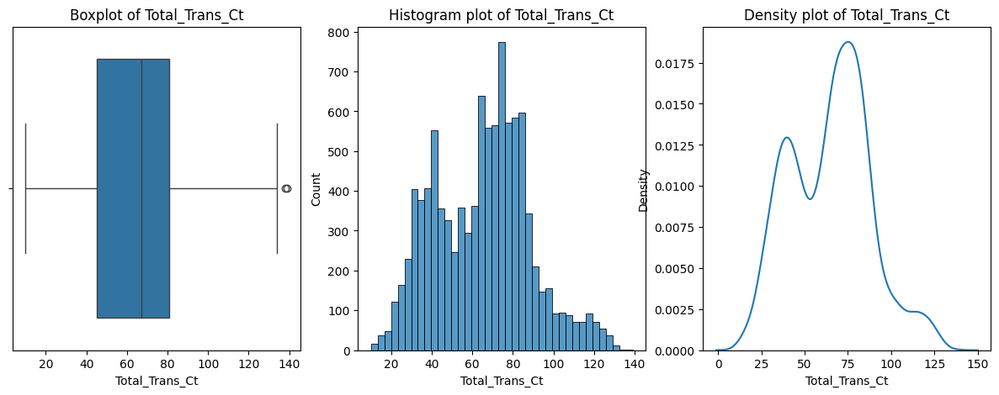

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 2 and the average of these outliers are: 138.5
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 45.0
*Quartile-2 (median) is: 67.0
*Quartile-3 is: 81.0
*Quartile-1 - 1.5*IQR =  -9.0
*Quartile-1 - 3*IQR =  -63.0
*Quartile-3 + 1.5*IQR =  135.0
*Quartile-3 + 3*IQR =  189.0
--------------------------------------------------
--------------------------------------------------
*Average of Total_Trans_Ct is: 64.86
*Standard deviation of Total_Trans_Ct is: 23.47
*Skewness of Total_Trans_Ct is: 0.15
*Kurtosis of Total_Trans_Ct is: -0.37
*Coefficient of variation of Total_Trans_Ct is: 0.36
*Signal to Noise Ratio of Total_Trans_Ct is: 2.76
**Note: Signal to Noise Ratio statistic is only applicable to va

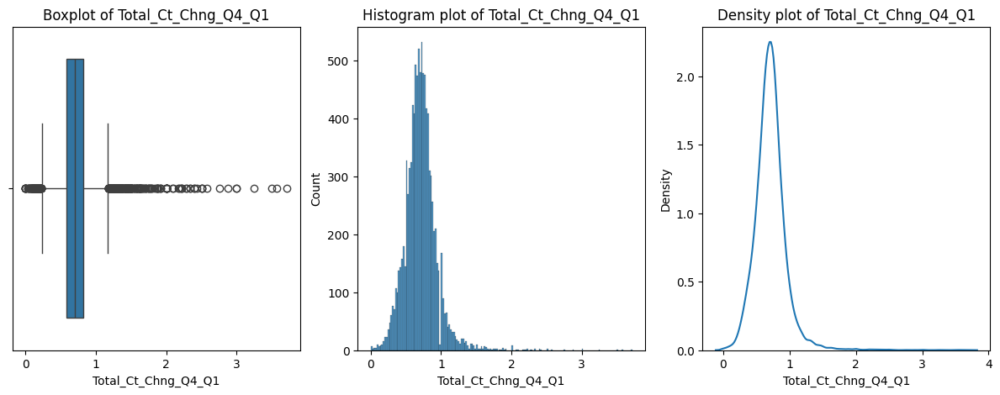

*The number of minor outliers beyond Quartile-3 + 1.5*IQR are: 218 and the average of these outliers are: 1.3
*The number major outliers beyond Quartile-3 + 3*IQR are: 80 and the average of these outliers are: 2.02
*The number of minor outliers below Quartile-1 - 1.5*IQR are: 96 and the average of these outliers are: 0.15
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 0.58
*Quartile-2 (median) is: 0.7
*Quartile-3 is: 0.82
*Quartile-1 - 1.5*IQR =  0.23
*Quartile-1 - 3*IQR =  -0.13
*Quartile-3 + 1.5*IQR =  1.17
*Quartile-3 + 3*IQR =  1.53
--------------------------------------------------
--------------------------------------------------
*Average of Total_Ct_Chng_Q4_Q1 is: 0.71
*Standard deviation of Total_Ct_Chng_Q4_Q1 is: 0.24
*Skewness of Total_Ct_Chng_Q4_Q1 is: 2.06
*Kurtosis of Total_Ct_Chng_Q4_Q1 is: 15.68
*Coefficient of variation of Total_Ct_Chng_Q4_Q1 is

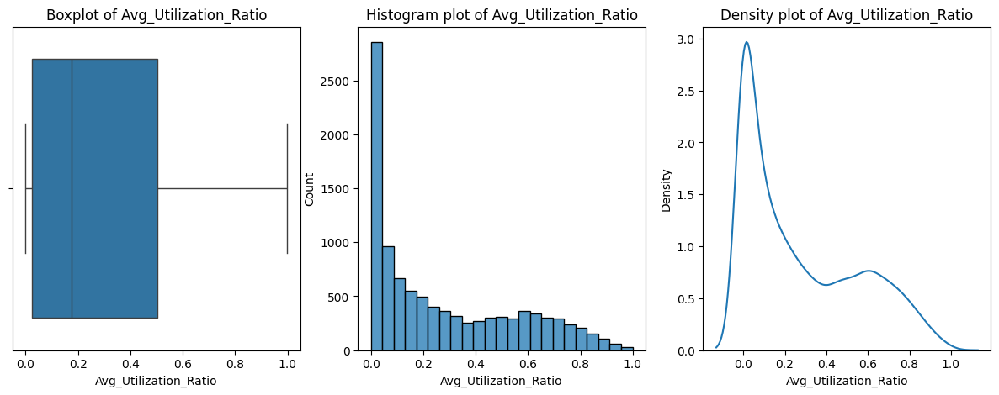

*There are no minor outliers beyond Quartile-3 + 1.5*IQR!
*There are no major outliers beyond Quartile-3 + 3*IQR!
*There are no minor outliers below Quartile-1 - 1.5*IQR!
*There are no major outliers below Quartile-1 - 3*IQR!
--------------------------------------------------
--------------------------------------------------
*Quartile-1 is: 0.02
*Quartile-2 (median) is: 0.18
*Quartile-3 is: 0.5
*Quartile-1 - 1.5*IQR =  -0.7
*Quartile-1 - 3*IQR =  -1.42
*Quartile-3 + 1.5*IQR =  1.22
*Quartile-3 + 3*IQR =  1.94
--------------------------------------------------
--------------------------------------------------
*Average of Avg_Utilization_Ratio is: 0.27
*Standard deviation of Avg_Utilization_Ratio is: 0.28
*Skewness of Avg_Utilization_Ratio is: 0.72
*Kurtosis of Avg_Utilization_Ratio is: -0.8
*Coefficient of variation of Avg_Utilization_Ratio is: 1.0
*Signal to Noise Ratio of Avg_Utilization_Ratio is: 1.0
**Note: Signal to Noise Ratio statistic is only applicable to variables which are 

In [ ]:
#Batch unviariate analysis for quantitative variables
for i in numeric_col:
  univariate_analysis(data, feature = i)


In [ ]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=45, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

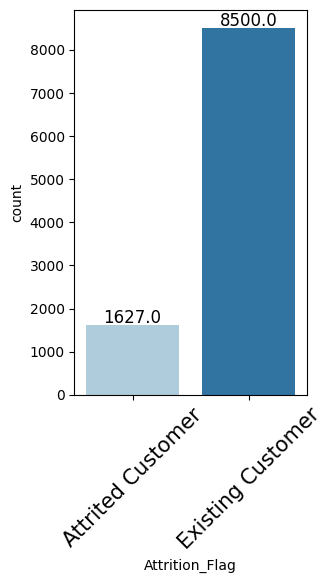

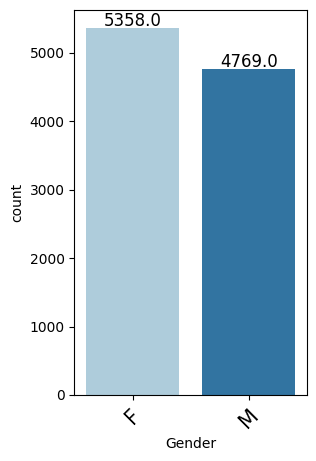

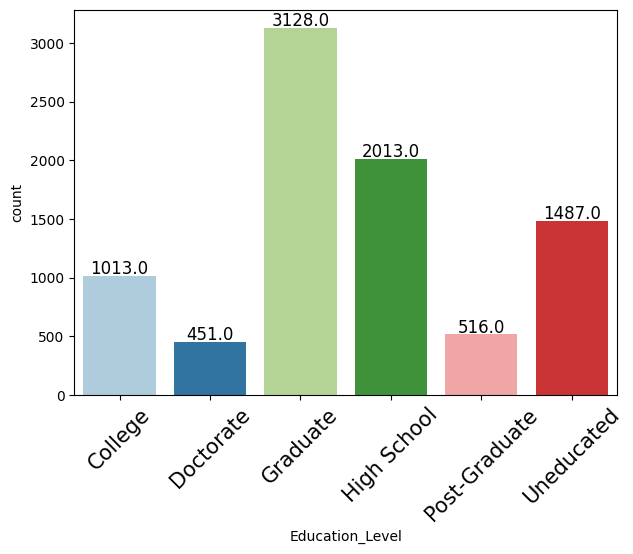

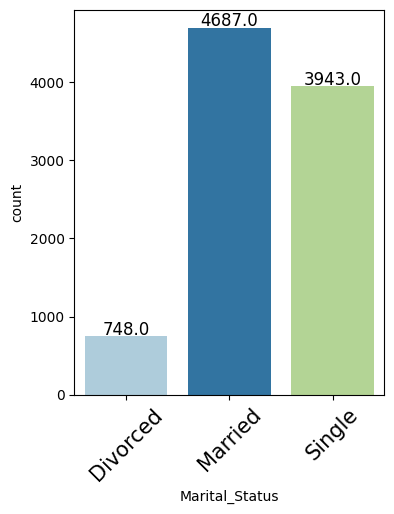

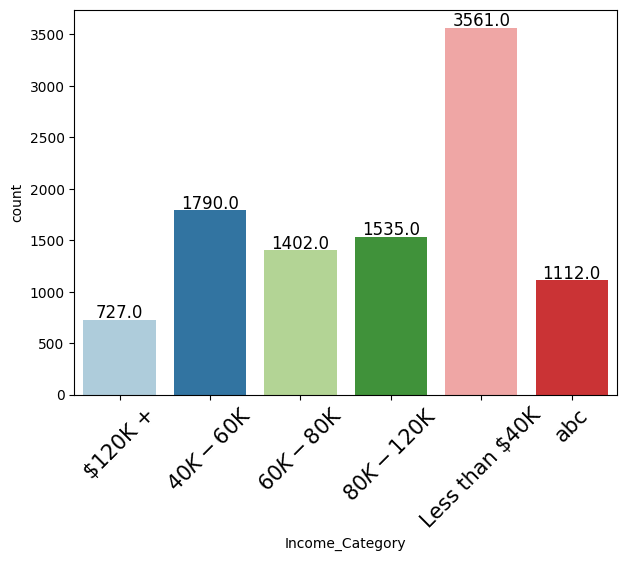

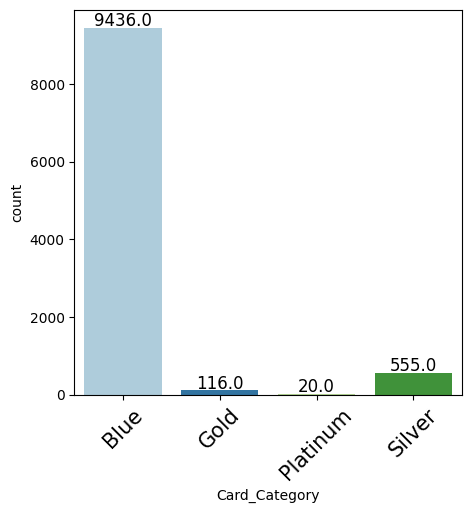

In [ ]:
#Batch categorical variable analysis
for i in categorical_col:
  labeled_barplot(data[categorical_col], feature = i)



*   **We note the churn (attrited customer) rate to be 16.1%**




##Bivariate Analysis

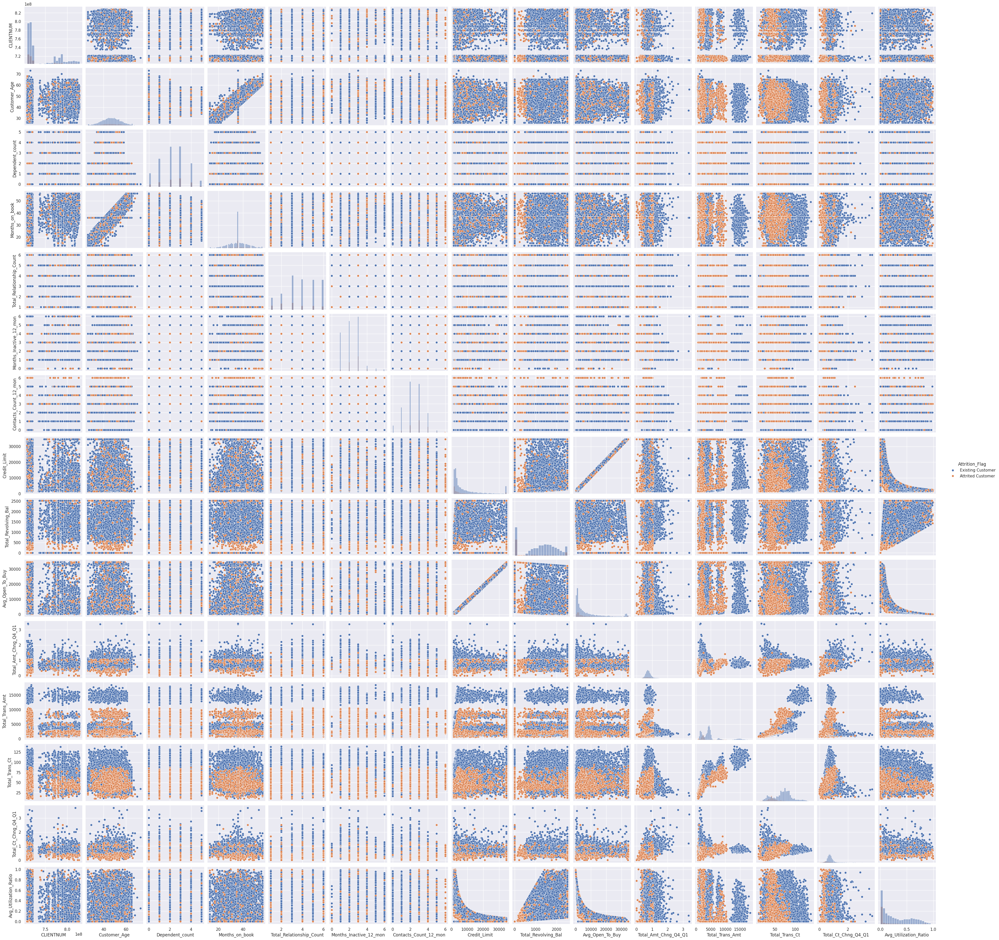

In [ ]:
sns.set(rc={"figure.figsize": (10, 7)})
sns.pairplot(data, hue = "Attrition_Flag", diag_kind = 'hist')

###We take a closer look at the relationship between Credit Limit and Average Utilization Ratio as a function of Income Category. Average Utilization ratio is a direct measurement of usage of the credit card.

In [ ]:
Attrited = data[data['Total_Trans_Amt']<12500]
Existing = data[data['Total_Trans_Amt']>=12500]


In [ ]:
Attrited['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    7763
Attrited Customer    1627
Name: count, dtype: int64

In [ ]:
Existing['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    737
Name: count, dtype: int64

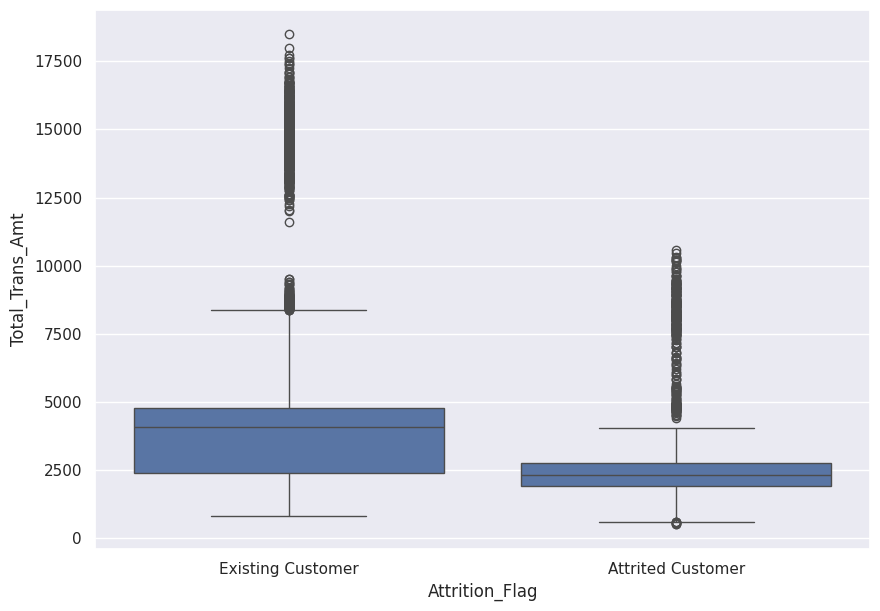

In [ ]:
sns.boxplot(x = 'Attrition_Flag', y = 'Total_Trans_Amt', data = data) ;

###From the information above, we see that churn customers have a lower credit limit and a higher percentage of less than \$40K income relative to existing customers. These factors could explain to a significant degree differences in churn vs. not churn. It is difficult and non-advisable to discretize a continues variable such as income in this case as it makes gleaning insights more difficult.

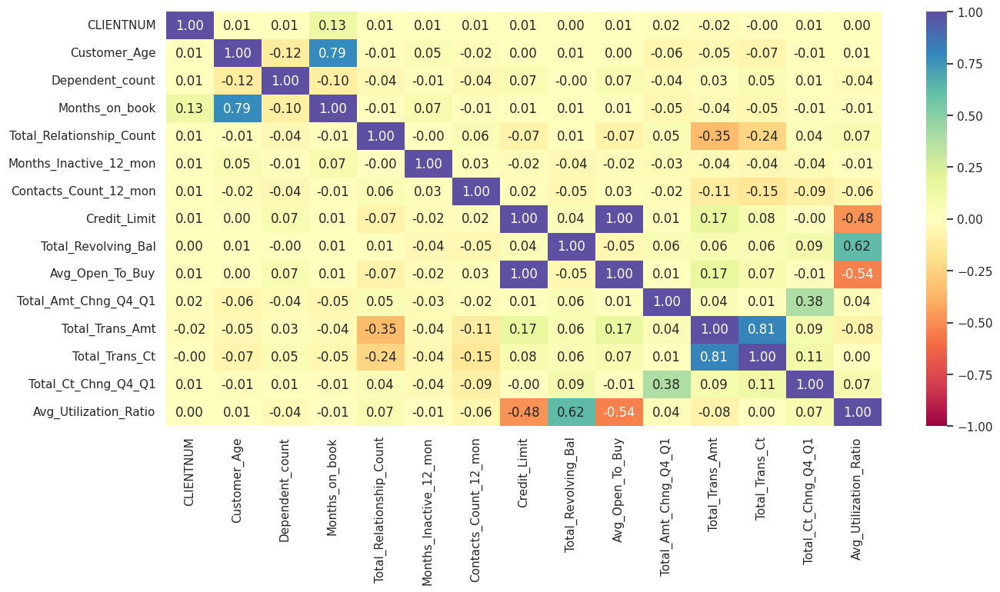

In [ ]:
plt.figure(figsize=(15, 7))
sns.heatmap(data[numeric_col].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

###Not many notable correlations that haven't already been cited; however, the bank has a strong positive relationship between older customers and the number of months a customer has been with the bank. This could be a 'loyalty' metric to demonstrate that older customers are more stable customers for income purposes for the bank.

##Data Preprocessing

In [ ]:
df = data.copy()

In [ ]:
df['Attrition_Flag'].replace(['Existing Customer', 'Attrited Customer'],
                        [0, 1], inplace=True)

In [ ]:
df['Attrition_Flag'] = df['Attrition_Flag'].astype(int)

In [ ]:
X = df.drop(["Attrition_Flag"], axis=1)
y = df["Attrition_Flag"]



In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Attrition_Flag, dtype: int64

In [ ]:
# Splitting data into training, validation and test sets:
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=1, stratify=y
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=1, stratify=y_temp
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 20) (2026, 20) (2026, 20)


##Missing-Value Treatment

In [ ]:
# Let's impute the missing values
imp_mode = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
cols_to_impute = ["Education_Level", "Marital_Status"]

# fit and transform the imputer on train data
X_train[cols_to_impute] = imp_mode.fit_transform(X_train[cols_to_impute])

# Transform on validation and test data
X_val[cols_to_impute] = imp_mode.transform(X_val[cols_to_impute])

# fit and transform the imputer on test data
X_test[cols_to_impute] = imp_mode.transform(X_test[cols_to_impute])

In [ ]:
# Creating dummy variables for categorical variables
X_train = pd.get_dummies(data=X_train, drop_first=True)
X_val = pd.get_dummies(data=X_val, drop_first=True)
X_test = pd.get_dummies(data=X_test, drop_first=True)

In [ ]:
# Checking class balance for whole data, train set, validation set and test set
print(y.value_counts(normalize=True))
print('-'*40)
print(y_train.value_counts(normalize=True))
print('-'*40)
print(y_val.value_counts(normalize=True))
print('-'*40)
print(y_test.value_counts(normalize=True))

Attrition_Flag
0   0.839
1   0.161
Name: proportion, dtype: float64
----------------------------------------
Attrition_Flag
0   0.839
1   0.161
Name: proportion, dtype: float64
----------------------------------------
Attrition_Flag
0   0.839
1   0.161
Name: proportion, dtype: float64
----------------------------------------
Attrition_Flag
0   0.840
1   0.160
Name: proportion, dtype: float64


In [ ]:
y_test.head()

9760    0
7413    1
6074    0
3520    0
6103    1
Name: Attrition_Flag, dtype: int64



*   **The ratio of the two classes is preserved across splits of the data!**




#Model Building

##The Recall metric is preferable for model performance given a binary loss decision:
  1) Lost profit from an existing customer.
  2) The opportunity cost from austerity in loaning money to potential customers via issuing the actual credit card

##The greater loss is the lost profit fromm an existing customer  

##Bank wants to maximize recall: to reduce reduce number of false negatives

####Initial Model Building

In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train, y=y_train, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 77.86708529565672
Random forest: 73.87022501308216
GBM: 81.55416012558871
Adaboost: 81.96336996336996
Xgboost: 86.36891679748823
dtree: 77.55625327053897

Validation Performance:

Bagging: 0.8098159509202454
Random forest: 0.8006134969325154
GBM: 0.8650306748466258
Adaboost: 0.8404907975460123
Xgboost: 0.8834355828220859
dtree: 0.8159509202453987


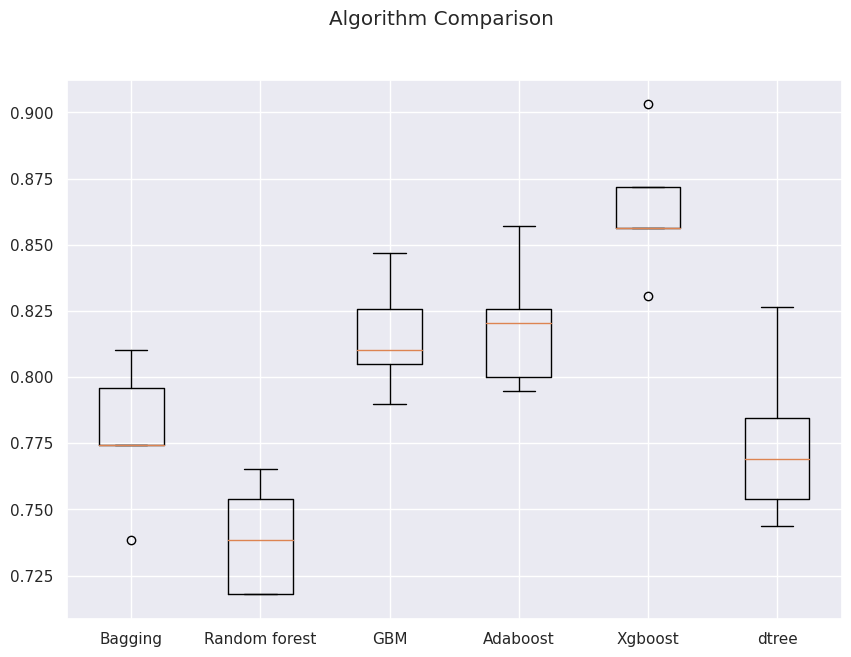

In [ ]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()



*   We see XGBoost gives performs the best in terms of cross-validated recall followed by Adaboost with GBM very close to Adaboost and off by sigFig digits.
*   From the boxplot, we see XGBoost performing best and Adaboost and GBM with very similar performance, however according to the boxplot, Adaboost had a higher median cross-validated recall. From the validation set, GBM performed slightly better than Adaboost.



##Oversampling and Undersampling the train data

###Oversampling train data using SMOTE

In [ ]:
# Import the SMOTE class from the imblearn.over_sampling module.
from imblearn.over_sampling import SMOTE

In [ ]:
#Fit SMOTE on train data (Synthetic Minority Oversampling Technique)
sm = SMOTE(sampling_strategy = .2, k_neighbors = 5, random_state = 1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
print("Before OverSampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After OverSampling, count of label '1': {}".format(sum(y_train_over == 1)))
print("After OverSampling, count of label '0': {} \n".format(sum(y_train_over == 0)))

print("After OverSampling, the shape of train_X: {})".format(X_train_over.shape))
print("After OverSampling, the shape of train_y: {}".format(y_train_over.shape))

Before OverSampling, count of label '1': 976
Before OverSampling, count of label '0': 5099 

After OverSampling, count of label '1': 1019
After OverSampling, count of label '0': 5099 

After OverSampling, the shape of train_X: (6118, 31))
After OverSampling, the shape of train_y: (6118,)


In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_over, y_train_over)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 78.99980681927946
Random forest: 74.88264271225731
GBM: 80.9639717956148
Adaboost: 81.6487974500145
Xgboost: 86.84922244759974
dtree: 76.64155317299333

Validation Performance:

Bagging: 0.7944785276073619
Random forest: 0.7852760736196319
GBM: 0.8711656441717791
Adaboost: 0.8343558282208589
Xgboost: 0.8987730061349694
dtree: 0.8251533742331288


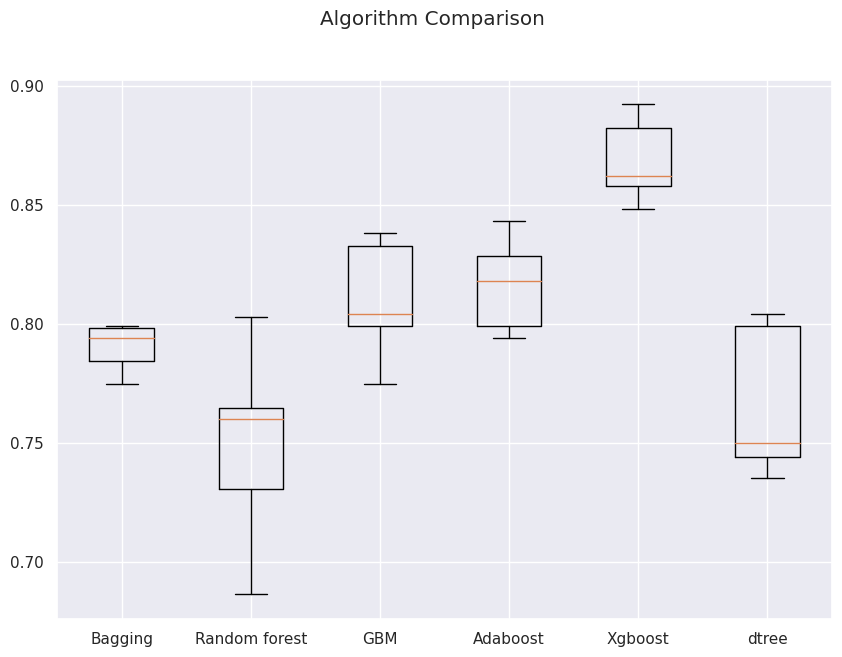

In [ ]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()



*   From above, we see for the cross validated oversampled data, Xgboost performed best followed by GBM.
*   From the boxplot, Xgboost consistently performs best and is best on Validation set as well



##Undersampling train data using Random Undersampler

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
#fit random under sampler on the train data
rus = RandomUnderSampler(random_state = 1, sampling_strategy = 1)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train)


In [ ]:
print("Before Under Sampling, count of label '1': {}".format(sum(y_train == 1)))
print("Before Under Sampling, count of label '0': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, count of label '1': {}".format(sum(y_train_under == 1)))
print("After Under Sampling, count of label '0': {} \n".format(sum(y_train_under == 0)))

print("After Under Sampling, the shape of train_X: {})".format(X_train_under.shape))
print("After Under Sampling, the shape of train_y: {}".format(y_train_under.shape))

Before Under Sampling, count of label '1': 976
Before Under Sampling, count of label '0': 5099 

After Under Sampling, count of label '1': 976
After Under Sampling, count of label '0': 976 

After Under Sampling, the shape of train_X: (1952, 31))
After Under Sampling, the shape of train_y: (1952,)


In [ ]:
models = []  # Empty list to store all the models

# Appending models into the list
models.append(("Bagging", BaggingClassifier(random_state=1)))
models.append(("Random forest", RandomForestClassifier(random_state=1)))
models.append(("GBM", GradientBoostingClassifier(random_state=1)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1)))
models.append(("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")))
models.append(("dtree", DecisionTreeClassifier(random_state=1)))

results = []  # Empty list to store all model's CV scores
names = []  # Empty list to store name of the models
score = []
# loop through all models to get the mean cross validated score
print("\n" "Cross-Validation Performance:" "\n")
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(
        n_splits=5, shuffle=True, random_state=1
    )  # Setting number of splits equal to 5
    cv_result = cross_val_score(
        estimator=model, X=X_train_under, y=y_train_under, scoring=scoring, cv=kfold
    )
    results.append(cv_result)
    names.append(name)
    print("{}: {}".format(name, cv_result.mean() * 100))

print("\n" "Validation Performance:" "\n")

for name, model in models:
    model.fit(X_train_under, y_train_under)
    scores = recall_score(y_val, model.predict(X_val))
    score.append(scores)
    print("{}: {}".format(name, scores))


Cross-Validation Performance:

Bagging: 90.26739926739926
Random forest: 93.54735740450026
GBM: 94.05756148613293
Adaboost: 92.72736787022502
Xgboost: 95.08320251177395
dtree: 89.03506017791732

Validation Performance:

Bagging: 0.9386503067484663
Random forest: 0.9294478527607362
GBM: 0.950920245398773
Adaboost: 0.9570552147239264
Xgboost: 0.9601226993865031
dtree: 0.901840490797546


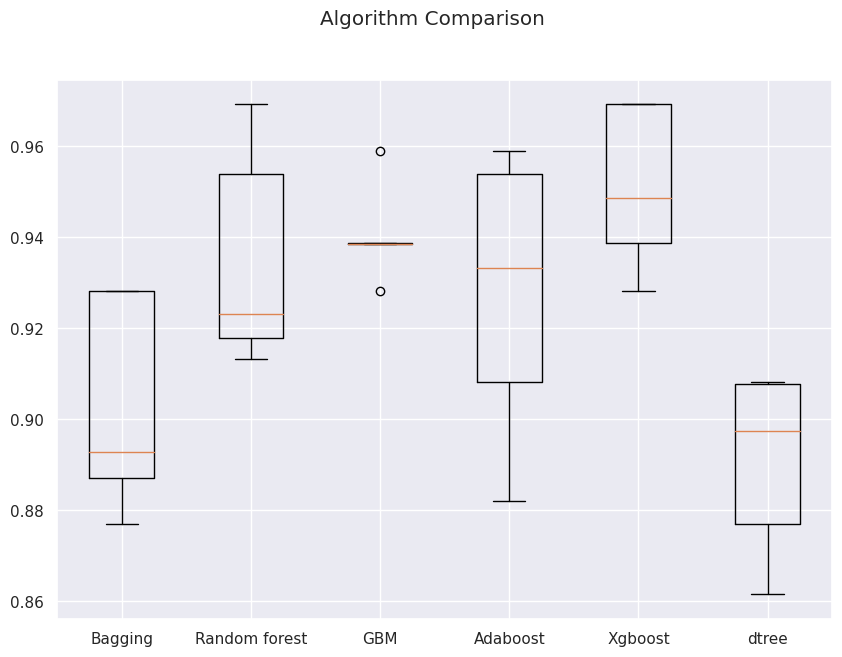

In [ ]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure()

fig.suptitle("Algorithm Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)

plt.show()



*   Xgboost followed by GBM performed well on the cross-validated undersampled data
*   From the boxplot, most models performed very well with decision tree lagging in the validation set relative to others ; however, Xgboost leads in the validation set with Adaboost and GBM performing very similiarly.



##Hyperparameter Tuning

##We will tune the XGboost model using Randomized Search

In [ ]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn
def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf

In [ ]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

#Randomized Search XGBoost

In [ ]:
%%time

# defining model
model = XGBClassifier(random_state=1,eval_metric='logloss')

# Parameter grid to pass in RandomizedSearchCV
param_grid={'n_estimators':np.arange(50,150,50),
            'scale_pos_weight':[2,5,10],
            'learning_rate':[0.01,0.1,0.2,0.05],
            'gamma':[0,1,3,5],
            'subsample':[0.8,0.9,1],
            'max_depth':np.arange(1,5,1),
            'reg_lambda':[5,10]}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
xgb_tuned2 = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=50, scoring=scorer, cv=5, random_state=1, n_jobs = -1)

#Fitting parameters in RandomizedSearchCV
xgb_tuned2.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(xgb_tuned2.best_params_,xgb_tuned2.best_score_))

Best parameters are {'subsample': 0.9, 'scale_pos_weight': 10, 'reg_lambda': 5, 'n_estimators': 50, 'max_depth': 1, 'learning_rate': 0.01, 'gamma': 1} with CV score=1.0:
CPU times: user 2.13 s, sys: 394 ms, total: 2.53 s
Wall time: 49.1 s


In [ ]:
# building model with best parameters
xgb_tuned2 = XGBClassifier(
    random_state=1,
    n_estimators=50,
    scale_pos_weight=10,
    gamma=1,
    subsample=0.9,
    learning_rate=0.01,
    eval_metric="logloss",
    max_depth=1,
    reg_lambda=5,
)
# Fit the model on training data
xgb_tuned2.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=1, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=1,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=50,
              n_jobs=None, num_parallel_tree=None, random_state=1, ...)

In [ ]:
# Calculating different metrics on train set
xgboost_random_train = model_performance_classification_sklearn(
    xgb_tuned2, X_train, y_train
)
print("Training performance:")
xgboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.161,1.000,0.161,0.277


In [ ]:
# Calculating different metrics on validation set
xgboost_random_val = model_performance_classification_sklearn(xgb_tuned2, X_val, y_val)
print("Validation performance:")
xgboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.161,1.000,0.161,0.277


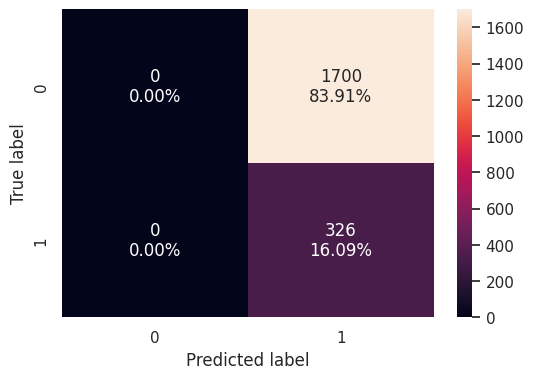

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(xgb_tuned2, X_val, y_val)

#Feature Importance

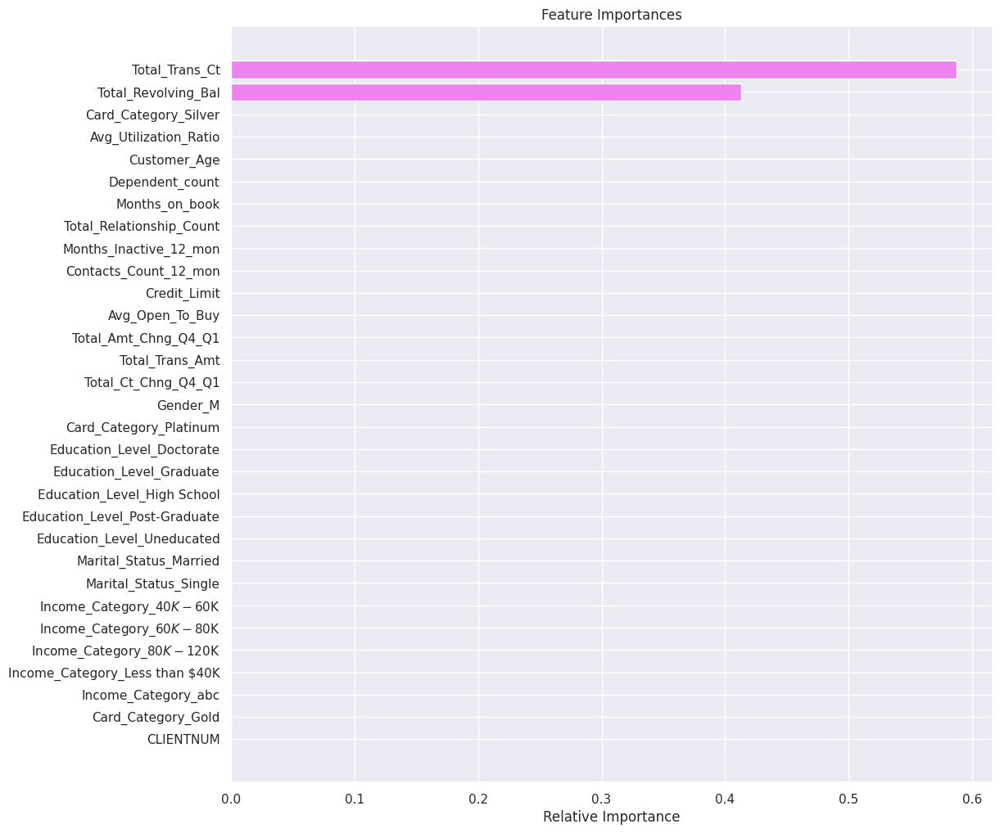

In [ ]:
feature_names = X_train.columns
importances = xgb_tuned2.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Here, we see the two most important variables are Total Transaction Count and Total Revolving Balance. This is sensible as higher levels of both of these variables create a disincentive for customers with lower incomes to maintain cards given higher fees.

#Conclusions & Insights



*   This analysis would have been more insightful to have data on the amount of fees, type of fees, etc.
*   The bank may benefit from establishing a dynamic fee model to account for income of customers in setting and charging fees.

*   Knowing also the interest rate charged would be beneficial as interest rate on the revolving balance coupled with other fees stands as a disincentive for the majority subpopulation the bank has as customers.




